<a href="https://colab.research.google.com/github/shambhavisrege/LitSurvey/blob/main/demo_race_classification.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

## Copy the data to MyDrive: [Google Drive Folder](https://drive.google.com/drive/folders/1n929V9daji9IspX15vD97msUESHef5Qw?usp=sharing)

In [ ]:
from google.colab import drive
drive.mount('/content/gdrive')

Mounted at /content/gdrive


##Downgrading the Python version, after running the cell go to runtime -> change runtime type -> py38

In [ ]:
!wget -O mini.sh https://repo.anaconda.com/miniconda/Miniconda3-py38_4.8.2-Linux-x86_64.sh
!chmod +x mini.sh
!bash ./mini.sh -b -f -p /usr/local
!conda install -q -y jupyter
!conda install -q -y google-colab -c conda-forge
!python -m ipykernel install --name "py38" --user

In [ ]:
import sys
print("User Current Version:-", sys.version)

User Current Version:- 3.8.18 (default, Sep 11 2023, 13:20:55) 
[GCC 11.2.0]


##Installing Dependencies (Take long to install)

In [ ]:
pip install dlib

In [ ]:
!pip install face_recognition

In [ ]:
pip install scikit_learn==0.22.2.post1

In [ ]:
pip install opencv-python

In [ ]:
pip install matplotlib

## Race Classification

In [ ]:
!python /content/gdrive/MyDrive/image-race-clasification/pred.py --img_dir /content/gdrive/MyDrive/image-race-clasification/test_images --model /content/gdrive/MyDrive/image-race-clasification/face_model.pkl

## Demo Image
0-> Asian, 1-> White 2-> Black

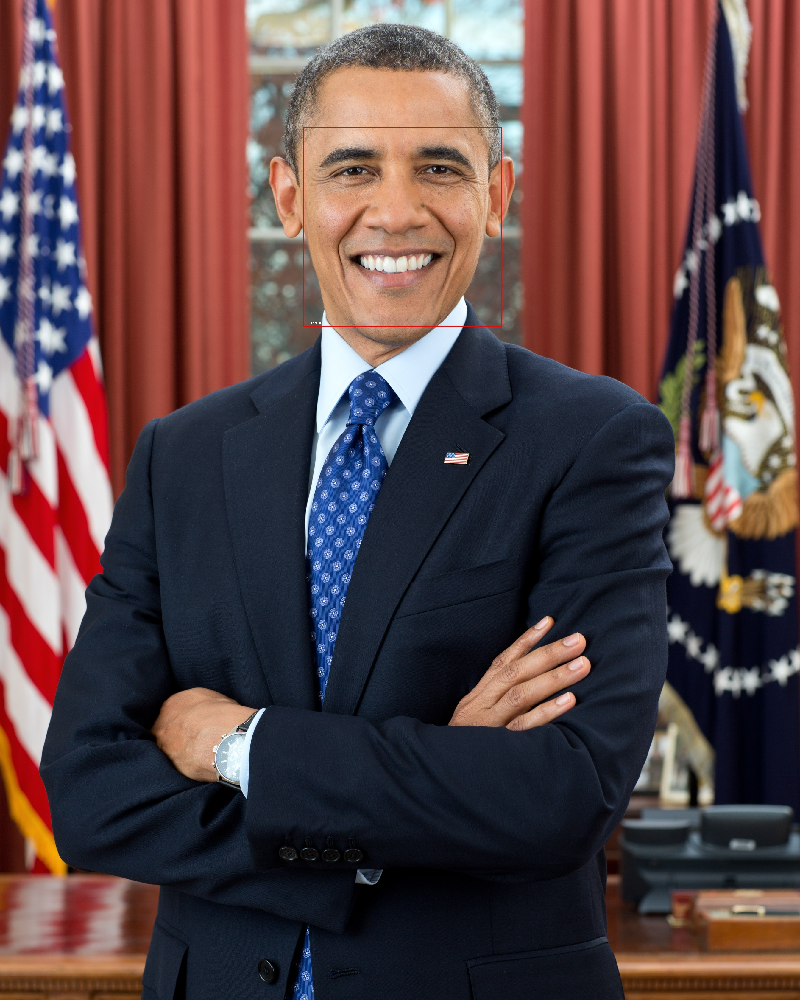

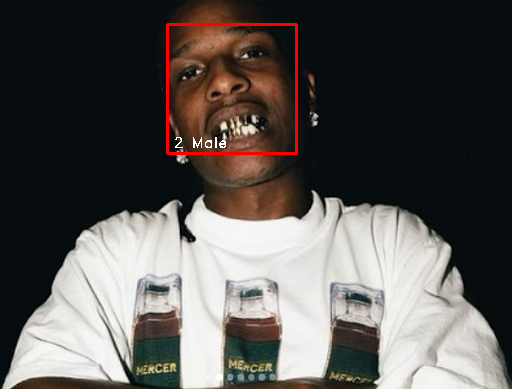

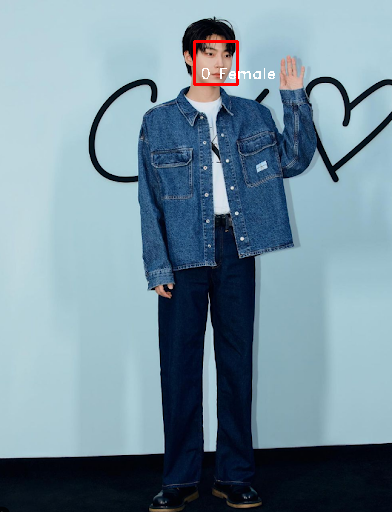

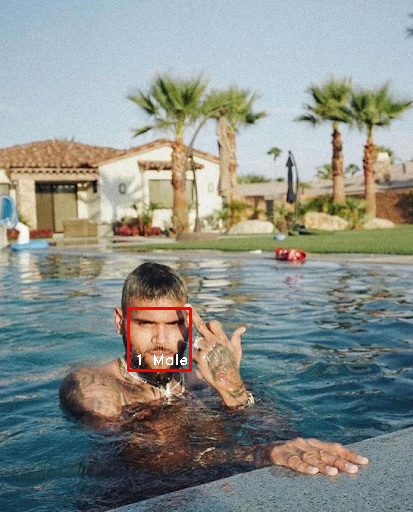

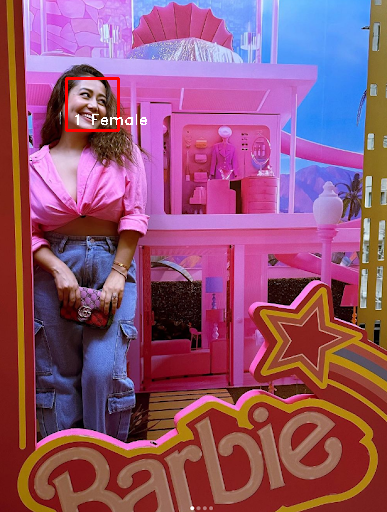

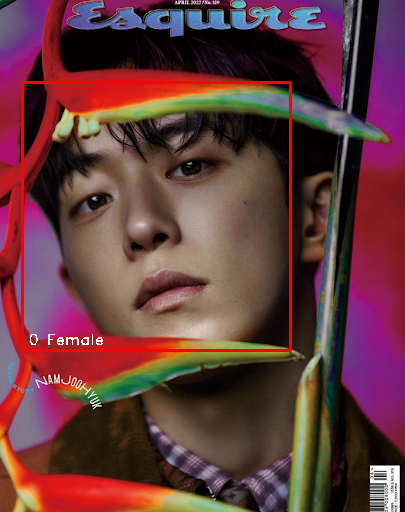

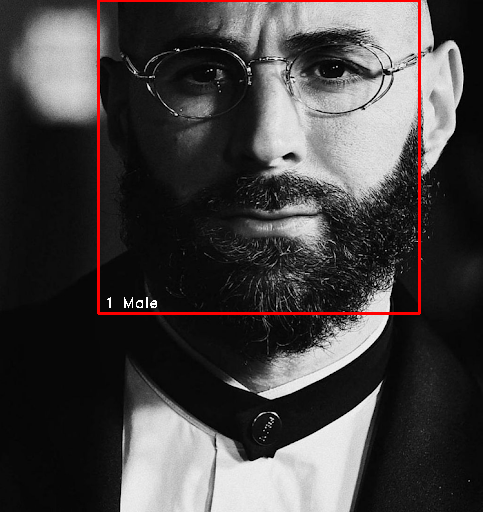

In [ ]:
from PIL import Image
from glob import glob
paths = ["./results/*.jpg", "./results/*.png"]
for i in range(len(paths)):
    for image_path in glob(paths[i]):
      image = Image.open(image_path)
      display(image)

##The Annotated files and the prediction CSVs are saved in the results folder under files on the left after running the cell above

In [ ]:
import pandas as pd
import os
path = "./results/*.csv"
df_concat = pd.read_csv("./results/Copy of ins_101.csv")
df_concat['Image name'] = "Copy of ins_101"
for csv_path in glob(path):
      df = pd.read_csv(csv_path)
      df['Image name'] = os.path.basename(csv_path).strip(".csv")
      df_concat = pd.concat([df_concat, df])



df_concat['gender predicted'] = 'Male'
for i in range(len(df_concat)):
  if df_concat['Male'].iloc[i] >= 0.5:
    df_concat['gender predicted'].iloc[i] = "Male"
  else:
    df_concat['gender predicted'].iloc[i] = "Female"

df_concat['race predicted'] = df_concat[['Asian', 'White', 'Black']].idxmax(axis=1)

In [ ]:
df_concat

,Male,Asian,White,Black,top,right,bottom,left,Image name,gender predicted,race predicted
0,0.993994,0.009942,0.965307,0.001730,0,419,313,98,Copy of ins_101,Male,White
0,0.077003,0.104206,0.250059,0.005534,78,118,130,66,Copy of ins_102,Female,White
0,0.993994,0.009942,0.965307,0.001730,0,419,313,98,Copy of ins_101,Male,White
0,0.985002,0.026931,0.136509,0.042297,428,1685,1094,1019,Copy of President_Barack_Obama,Male,White
0,0.383963,0.976906,0.090895,0.001425,41,237,84,194,Copy of ins_105,Female,Asian
0,0.822464,0.005746,0.026982,0.691026,24,296,153,167,Copy of ins_259,Male,Black
0,0.484723,0.928063,0.131258,0.001796,82,290,350,22,Copy of ins_103,Female,Asian
0,0.955842,0.009361,0.683492,0.014907,308,190,370,128,Copy of ins_104,Male,White
